<a href="https://colab.research.google.com/github/Kenz2000/Projet-DATA2/blob/kenza_vf/bbc_bert_roberta.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installations des librairies

In [ ]:
pip install gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install ipython-autotime
%load_ext autotime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 561 µs (started: 2023-05-16 11:11:07 +00:00)


In [ ]:
pip install gensim

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 9.87 s (started: 2023-05-16 11:11:07 +00:00)


In [ ]:
pip install pandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 8.47 s (started: 2023-05-16 11:11:17 +00:00)


In [ ]:
pip install -U scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 8.35 s (started: 2023-05-16 11:11:25 +00:00)


In [ ]:
pip install tables

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 5.64 s (started: 2023-05-16 11:11:34 +00:00)


In [ ]:
pip install torch torchvision torchaudio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 11.6 s (started: 2023-05-16 11:11:39 +00:00)


In [ ]:
pip install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 6.34 s (started: 2023-05-16 11:11:51 +00:00)


In [ ]:
pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 11.4 s (started: 2023-05-16 11:11:57 +00:00)


In [ ]:
pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 6.65 s (started: 2023-05-16 11:12:09 +00:00)


# Chargement des utilitaires

In [ ]:
! gdown 'https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD'

Downloading...
From: https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD
To: /content/utils_py.py
100% 6.69k/6.69k [00:00<00:00, 16.9MB/s]
time: 1.52 s (started: 2023-05-16 11:12:15 +00:00)


In [ ]:
from gensim.models import KeyedVectors
import pandas as pd
import numpy as np
import warnings
import re

from utils_py import static_document_embeddings, tokenize_re

/content/utils_py.py:167: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if len(sys.argv) is not 3:


time: 15 s (started: 2023-05-16 11:12:17 +00:00)


# Chargement des données

In [ ]:
! gdown "https://drive.google.com/uc?id=1PSjnBVZM_hmM0jtQrZ7QNuzTeWDTPuHM"

Downloading...
From: https://drive.google.com/uc?id=1PSjnBVZM_hmM0jtQrZ7QNuzTeWDTPuHM
To: /content/bbc.csv
100% 5.10M/5.10M [00:00<00:00, 67.0MB/s]
time: 5.35 s (started: 2023-05-16 11:12:32 +00:00)


In [ ]:
df = pd.read_csv("./bbc.csv")
df
texts = df['text'].values
bbc_labels = df["label"].values
k_bbc = len(df['label'].unique())
print(k_bbc)
df.info()

5
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2225 entries, 0 to 2224
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  2225 non-null   int64 
 1   text        2225 non-null   object
 2   label       2225 non-null   object
dtypes: int64(1), object(2)
memory usage: 52.3+ KB
time: 280 ms (started: 2023-05-16 11:12:37 +00:00)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
time: 11.2 s (started: 2023-05-16 11:12:37 +00:00)


## Bert

In [ ]:
import torch

time: 540 µs (started: 2023-05-16 11:12:49 +00:00)


In [ ]:
! gdown "https://drive.google.com/uc?id=1-Msc4M3lNz-O0sy13iPhtQIYxw9GG3tJ"

Downloading...
From: https://drive.google.com/uc?id=1-Msc4M3lNz-O0sy13iPhtQIYxw9GG3tJ
To: /content/bbc_bert.h5
100% 82.2M/82.2M [00:03<00:00, 27.0MB/s]
time: 7.46 s (started: 2023-05-16 11:13:00 +00:00)


In [ ]:
bbc_bert = pd.read_hdf("bbc_bert.h5").to_numpy()

time: 1.02 s (started: 2023-05-16 11:13:08 +00:00)


## Roberta

In [ ]:
! gdown "https://drive.google.com/uc?id=1-jbNYCPMYeOvHMlewE8KYxob8dByECye"

Downloading...
From: https://drive.google.com/uc?id=1-jbNYCPMYeOvHMlewE8KYxob8dByECye
To: /content/bbc_roberta.h5
100% 82.2M/82.2M [00:00<00:00, 136MB/s]
time: 5.15 s (started: 2023-05-16 11:13:09 +00:00)


In [ ]:
bbc_roberta = pd.read_hdf("bbc_roberta.h5").to_numpy()

time: 337 ms (started: 2023-05-16 11:13:14 +00:00)


In [ ]:
df_bbc = pd.read_csv("./bbc.csv")
df_bbc
texts_bbc = df_bbc['text'].values
bbc_labels = df_bbc["label"].values
k_bbc = len(df_bbc['label'].unique())
print(k_bbc)
df_bbc.info()

5
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2225 entries, 0 to 2224
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  2225 non-null   int64 
 1   text        2225 non-null   object
 2   label       2225 non-null   object
dtypes: int64(1), object(2)
memory usage: 52.3+ KB
time: 113 ms (started: 2023-05-16 11:13:14 +00:00)


# Autoencodeur

In [ ]:
from torch.utils.data import DataLoader
import numpy as np
import torch
from tqdm import tqdm 

class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim

        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.embedding_dim)
        )
        
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.input_dim),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'

    if seed is not None:
      torch.manual_seed(seed)

    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)

    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)
          
          loss = loss_function(reconstructed, batch)
          
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
          
          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

time: 2.55 ms (started: 2023-05-16 11:13:14 +00:00)


# Importations

In [ ]:
pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 5.33 s (started: 2023-05-16 11:13:14 +00:00)


In [ ]:
pip install hdbscan

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
time: 4.83 s (started: 2023-05-16 11:13:20 +00:00)


In [ ]:
import hdbscan

time: 449 ms (started: 2023-05-16 11:13:25 +00:00)


In [ ]:
from sklearn.cluster import KMeans ,AgglomerativeClustering, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import numpy as np
from sklearn.metrics.cluster import normalized_mutual_info_score, adjusted_rand_score
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from umap import UMAP
from utils_py import accuracy


time: 17.2 s (started: 2023-05-16 11:13:25 +00:00)


#  Fonctions utilitaires

In [ ]:
def map_labels(labels):
    mapping = {}
    for (i,name) in enumerate(set(labels)):
        mapping[name] = i
    return [mapping[letter] for letter in labels]

time: 935 µs (started: 2023-05-16 11:13:42 +00:00)


In [ ]:
def eval_clustering_2D(x, labels, pred_labels, methods):
    fig, axes = plt.subplots(int((len(pred_labels)+1)/3) if not (len(pred_labels)+1)%3 else int((len(pred_labels)+1)/3+1) , 3, figsize=(20,25))
    axes = [item for sublist in axes for item in sublist]
    axes[0].scatter(x[:,0], x[:,1],
                    c=labels, edgecolor='none', alpha=1,)
    axes[0].title.set_text('Real Labels')
    results = {}
    for i in range(len(pred_labels)):
        nmi = normalized_mutual_info_score(labels, pred_labels[i])
        ari = adjusted_rand_score(labels, pred_labels[i])
        acc = accuracy(labels, pred_labels[i])
        results[methods[i]] = (nmi,ari,acc)
        axes[i+1].scatter(x[:,0], x[:,1],
                    c=pred_labels[i], edgecolor='none', alpha=1,)
        axes[i+1].title.set_text(f'{methods[i]}\nNMI = {nmi}\nARI={ari}\nAcc={acc}')
    plt.show()
    return results
    

time: 1.64 ms (started: 2023-05-16 11:13:42 +00:00)


In [ ]:
def run_clustering(X, k, labels, spectral=False):
    kmeans_labels = KMeans(k, random_state=42).fit(X).labels_
    hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X).labels_
    cah_labels_ward = AgglomerativeClustering(n_clusters=k).fit_predict(X)
    cah_labels_complete = AgglomerativeClustering(n_clusters=k, linkage="complete").fit_predict(X)
    cah_labels_average = AgglomerativeClustering(n_clusters=k, linkage="average").fit_predict(X)
    cah_labels_single = AgglomerativeClustering(n_clusters=k, linkage="single").fit_predict(X)
    gaussian = GaussianMixture(n_components=k, random_state=42).fit_predict(X)
    
    if spectral:
        spectral_labels = SpectralClustering(k, assign_labels="discretize", random_state=42).fit(X).labels_
        return eval_clustering_2D(X, labels, [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

    else:
        return eval_clustering_2D(X, labels, [kmeans_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

time: 1.5 ms (started: 2023-05-16 11:13:42 +00:00)


# Initialisations

In [ ]:
methods = ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"]
methods_noSpec = ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"]

time: 692 µs (started: 2023-05-16 11:13:42 +00:00)


In [ ]:
results_bbc_redim = {}
results_bbc_glove_redim = {}
results_bbc_bert_redim = {}
results_bbc_roberta_redim = {}

time: 704 µs (started: 2023-05-16 11:13:42 +00:00)


In [ ]:
df_bbc=df.copy()
df_bbc.groupby("label").size()

label
business         510
entertainment    386
politics         417
sport            511
tech             401
dtype: int64

time: 8.74 ms (started: 2023-05-16 11:13:42 +00:00)


# La représentation BERT

##Espace Original

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(bbc_bert)
kmeans_labels = KMeans(k_bbc, random_state=42).fit(bbc_bert).labels_
# spectral_labels = SpectralClustering(k_bbc, n_components= bbc_bert.shape[1], assign_labels="discretize", random_state=42).fit(bbc_bert).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(bbc_bert).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_bbc).fit_predict(bbc_bert)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_bbc, linkage="complete").fit_predict(bbc_bert)
cah_labels_average = AgglomerativeClustering(n_clusters=k_bbc, linkage="average").fit_predict(bbc_bert)
cah_labels_single = AgglomerativeClustering(n_clusters=k_bbc, linkage="single").fit_predict(bbc_bert)
#Crashes with RAM problem
# gaussian = GaussianMixture(n_components=k_bbc, random_state=42).fit_predict(bbc_bert)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


time: 4min 11s (started: 2023-05-16 11:13:42 +00:00)


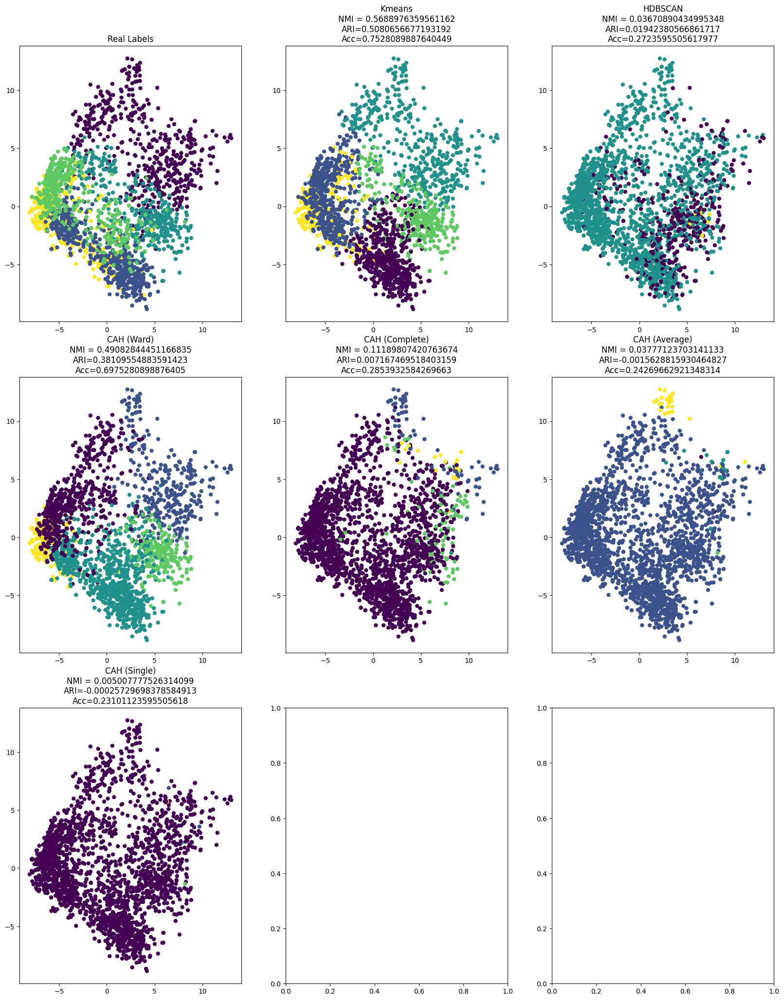

time: 2.36 s (started: 2023-05-16 11:17:54 +00:00)


In [ ]:
results_bbc_bert_redim["original"] = eval_clustering_2D(X_reduced, map_labels(bbc_labels), [kmeans_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

Il est intéressant de noter que les modèles Kmeans, CAH(Ward) font mieux que les autres modèles avec 75% et 69% respectivement.Cependant , les visualisations 2D nous montent que les différents algorithmes de clustering appliqué , n'aboutissent pas a former des groupes de points (clusters) bien séparés et homogènes.

## Espace réduit (approche tandem)

### PCA  avec 2 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


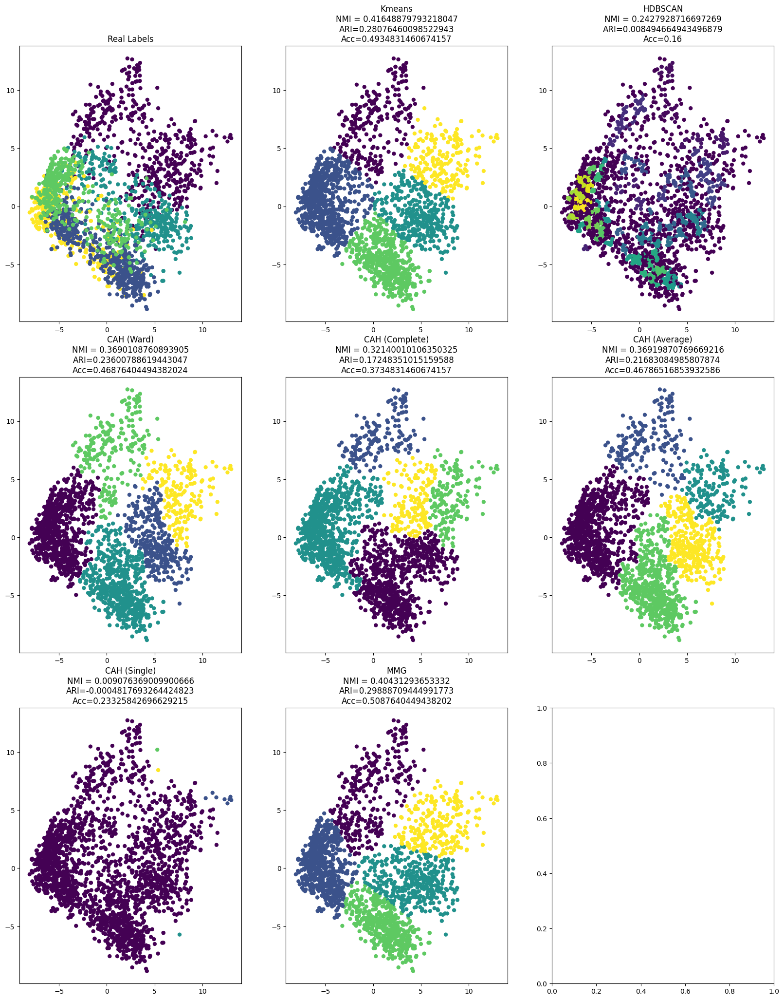

time: 4.02 s (started: 2023-05-16 11:17:56 +00:00)


In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(bbc_bert)
results_bbc_bert_redim['pca2'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels))

### PCA avec 20 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


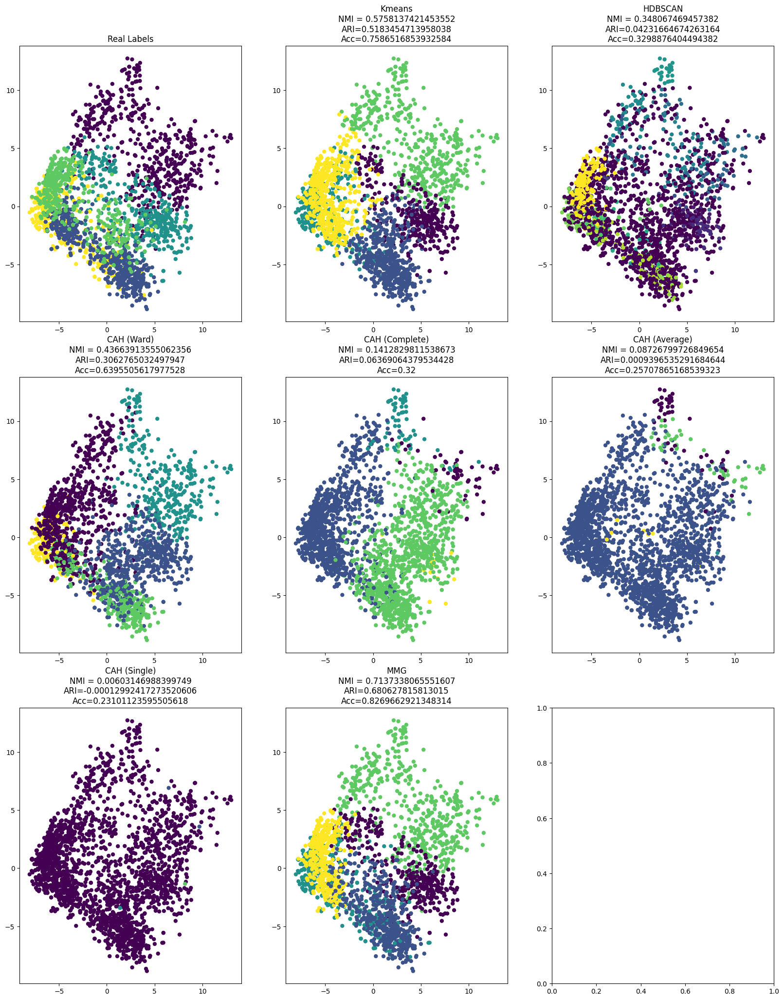

time: 7.51 s (started: 2023-05-16 11:18:00 +00:00)


In [ ]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(bbc_bert)
results_bbc_bert_redim['pca20'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels))

Les algorithmes utilisés peuvent être classés en deux catégories en fonction de leurs résultats. D'une part, il y a ceux qui fournissent des résultats moyens, tels que Kmeans, CAH(Ward), et MMG ,CAH(Complete). Leurs performances sont similaires et s'améliorent avec l'augmentation du nombre de composantes de l'ACP. Parmi eux, MMG se démarque en atteignant une précision de 82%. D'autre part, il y a ceux dont les résultats sont non significatifs, tels que HDBSCAN, CAH(Average), et CAH(Single), qui ont une ARI proche de zéro, ce qui indique des résultats non significatifs. Le meilleur modèle est MMG avec 20 composantes, avec une NMI de 71%, une ARI de 68% et une accuracy de 82%.

### TSNE avec 2 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


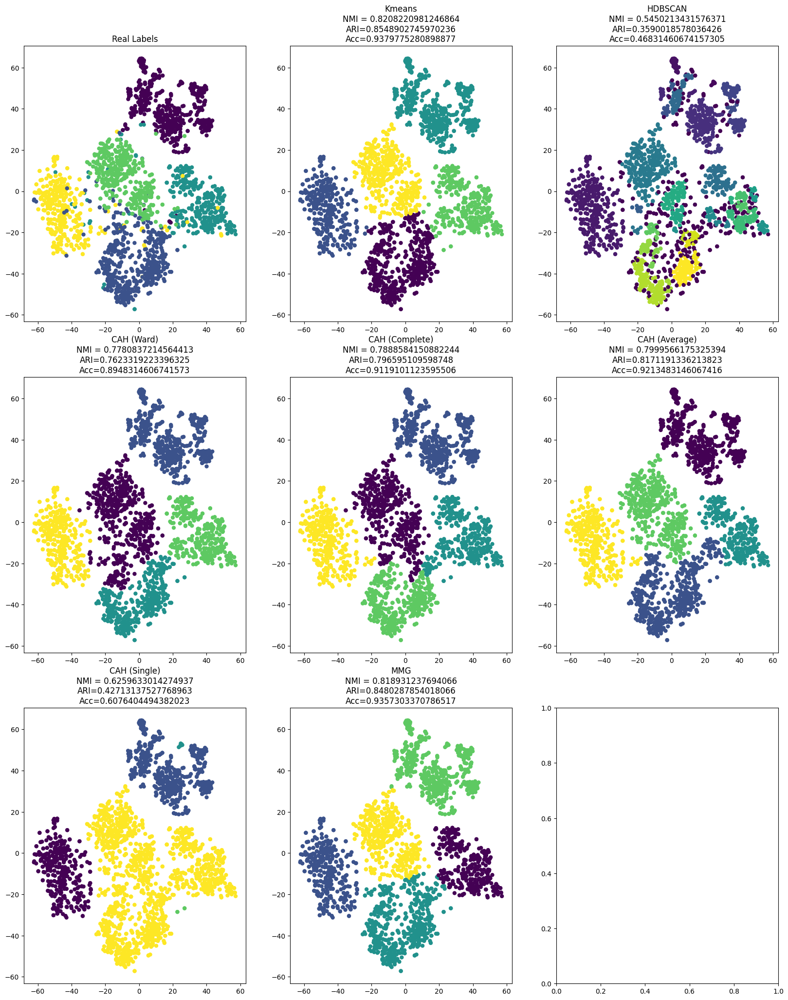

time: 27.7 s (started: 2023-05-16 11:18:08 +00:00)


In [ ]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(bbc_bert)
results_bbc_bert_redim['tsne'] = run_clustering(X_reduced_tsne, k_bbc, map_labels(bbc_labels))

L'application de tSNE aux données a entraîné une amélioration considérable des performances de tous les modèles, rendant les classes plus facilement distinguables dans cet espace. La différence de performance entre les projections PCA sont moins meilleures que tSNE. En particulier, l'utilisation de tSNE a significativement amélioré les performances des modèles HDBScan, CAH(Single-Min) et CAH(Average), avec une augmentation remarquable de l'indice de similarité NMI. De plus, les modèles Kmeans, CAH(Ward) et MMG ont également bénéficié de l'application de tSNE, qui a entraîné une amélioration de leurs performances. Le modèle MMG s'est démarqué en obtenant la meilleure précision avec un score de 94%.

### UMAP avec 2 composantes

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(bbc_bert)

time: 45.2 s (started: 2023-05-16 11:18:36 +00:00)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


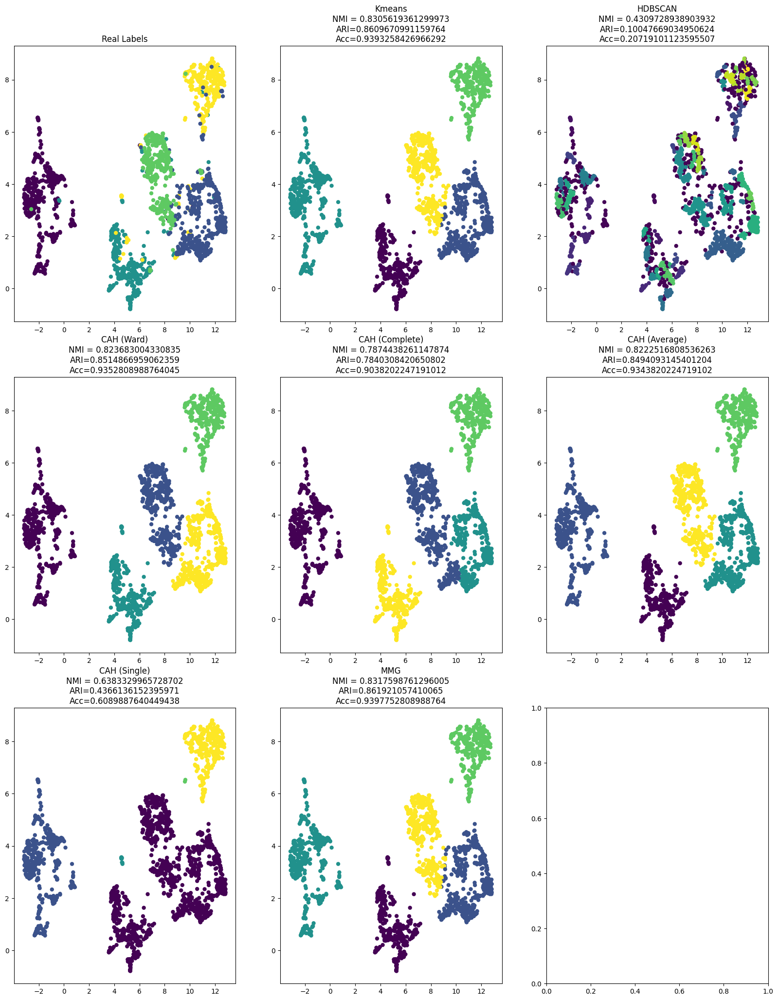

time: 2.46 s (started: 2023-05-16 11:19:21 +00:00)


In [ ]:
results_bbc_bert_redim['umap'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels))

### UMAP avec 20 composantes

In [ ]:
X_reduced = UMAP(n_components=20, random_state=42).fit_transform(bbc_bert)

time: 27.9 s (started: 2023-05-16 11:19:23 +00:00)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


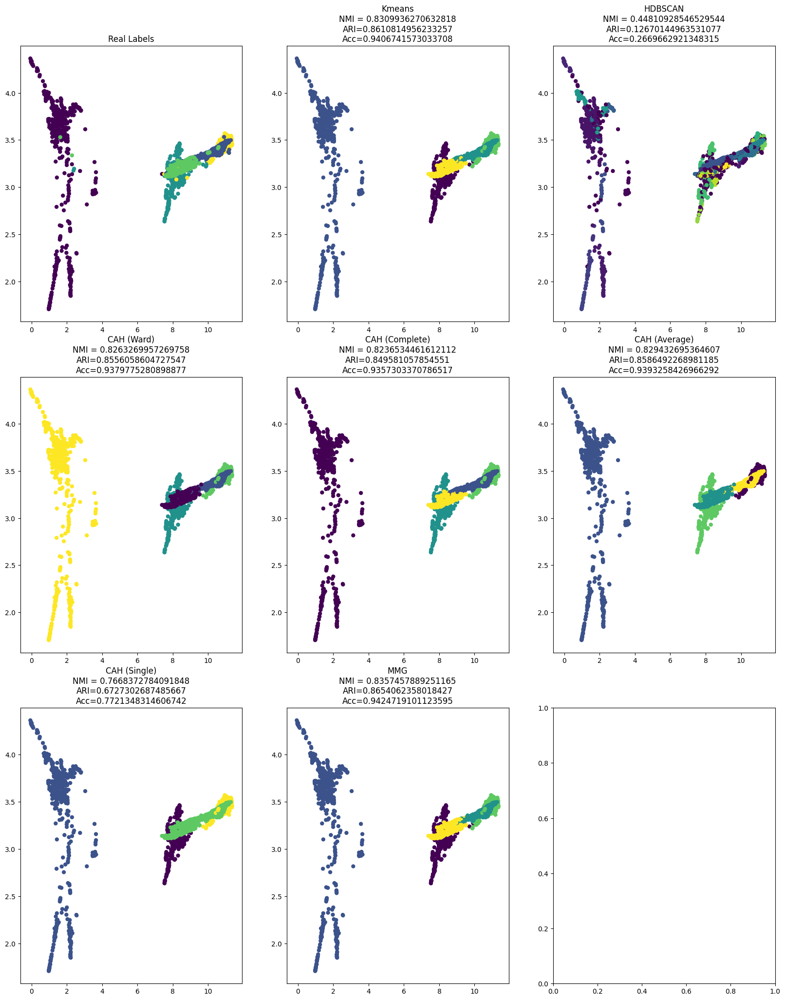

time: 3.11 s (started: 2023-05-16 11:19:51 +00:00)


In [ ]:
results_bbc_bert_redim['umap20'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels))

L'application de l'UMAP aux données a nettement amélioré les performances de tous les modèles, rendant les classes facilement séparables dans cet espace. Parmi les modèles testés, le modèle hiérarchique CAH avec a la fois le critère de Ward et Average ont convergé vers le même modèle, atteignant une accuracy  de 93,88%. Kmeans et MMG se sont révélés être les meilleurs modèles, avec MMG légèrement en tête, affichant une accuracy de 94,24%. En revanche, HDBSCAN s'est avéré être le moins performant avec une précision de seulement 42%.

### Autoencodeur avec 2 composantes

In [ ]:
'''n_components=2
X_reduced = autoencoder(bbc_bert.astype("float32"), n_components, seed=42, learning_rate=1e-3)'''

'n_components=2\nX_reduced = autoencoder(bbc_bert.astype("float32"), n_components, seed=42, learning_rate=1e-3)'

time: 3.27 ms (started: 2023-05-16 11:19:54 +00:00)


In [ ]:
#results_bbc_bert_redim['autoencoder'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels))

time: 334 µs (started: 2023-05-16 11:19:54 +00:00)


En analysant les résultats de l'application des différentes méthodes de clustering sur l'espace généré par l'autoencodeur, on constate que les classes sont moins facilement séparables dans cet espace, en raison d'un chevauchement important entre elles. Toutefois, deux modèles se distinguent : Kmeans et CAH(Ward). Ces modèles obtiennent des précisions respectives de 67% et 65%, ce qui suggère qu'ils parviennent à mieux discriminer les différentes classes malgré la difficulté inhérente à l'espace de l'autoencodeur.

## Interpretations des resultats 

In [ ]:
from copy import deepcopy
results_temp = deepcopy(results_bbc_bert_redim)
for method in results_temp:
    for result in results_temp[method]:
        nmi, ari, acc = results_temp[method][result]
        results_temp[method][result] = {
            'nmi': nmi,
            "ari": ari,
            'acc': acc
        }

time: 5.45 ms (started: 2023-05-16 11:19:54 +00:00)


In [ ]:
results_bert_bbc = pd.DataFrame.from_dict({(i,j): results_temp[i][j] 
                           for i in results_temp.keys() 
                           for j in results_temp[i].keys()},
                       orient='index')

time: 18.7 ms (started: 2023-05-16 11:19:54 +00:00)


In [ ]:
results_bert_bbc

nmi       ari       acc
original Kmeans          0.568898  0.508066  0.752809
         HDBSCAN         0.036709  0.019424  0.272360
         CAH (Ward)      0.490828  0.381096  0.697528
         CAH (Complete)  0.111898  0.007167  0.285393
         CAH (Average)   0.037771 -0.001563  0.242697
         CAH (Single)    0.005008 -0.000257  0.231011
pca2     Kmeans          0.416489  0.280765  0.493483
         HDBSCAN         0.242793  0.008495  0.160000
         CAH (Ward)      0.369011  0.236008  0.468764
         CAH (Complete)  0.321400  0.172484  0.373483
         CAH (Average)   0.369199  0.216831  0.467865
         CAH (Single)    0.009076 -0.000482  0.233258
         MMG             0.404313  0.298887  0.508764
pca20    Kmeans          0.575814  0.518345  0.758652
         HDBSCAN         0.348067  0.042317  0.329888
         CAH (Ward)      0.436639  0.306277  0.639551
         CAH (Complete)  0.141283  0.063691  0.320000
         CAH (Average)   0.087268  0.000940  0.257079
         CAH (Single)    0.006031 -0.000130  0.231011
         MMG             0.713734  0.680628  0.826966
tsne     Kmeans          0.820822  0.854890  0.937978
         HDBSCAN         0.545021  0.359002  0.468315
         CAH (Ward)      0.778084  0.762332  0.894831
         CAH (Complete)  0.788858  0.796595  0.911910
         CAH (Average)   0.799957  0.817119  0.921348
         CAH (Single)    0.625963  0.427131  0.607640
         MMG             0.818931  0.848029  0.935730
umap     Kmeans          0.830562  0.860967  0.939326
         HDBSCAN         0.430973  0.100477  0.207191
         CAH (Ward)      0.823683  0.851487  0.935281
         CAH (Complete)  0.787444  0.784031  0.903820
         CAH (Average)   0.822252  0.849409  0.934382
         CAH (Single)    0.638333  0.436614  0.608989
         MMG             0.831760  0.861921  0.939775
umap20   Kmeans          0.830994  0.861081  0.940674
         HDBSCAN         0.448109  0.126701  0.266966
         CAH (Ward)      0.826327  0.855606  0.937978
         CAH (Complete)  0.823653  0.849581  0.935730
         CAH (Average)   0.829433  0.858649  0.939326
         CAH (Single)    0.766837  0.672730  0.772135
         MMG             0.835746  0.865406  0.942472

time: 27.4 ms (started: 2023-05-16 11:19:54 +00:00)


In [ ]:
metric = "ari"
results_bert_bbc[results_bert_bbc[metric] == results_bert_bbc[metric].max()]

,,nmi,ari,acc
umap20,MMG,0.835746,0.865406,0.942472


time: 15.2 ms (started: 2023-05-16 11:19:54 +00:00)


In [ ]:
metric = "nmi"
results_bert_bbc[results_bert_bbc[metric] == results_bert_bbc[metric].max()]

,,nmi,ari,acc
umap20,MMG,0.835746,0.865406,0.942472


time: 22.3 ms (started: 2023-05-16 11:19:54 +00:00)


In [ ]:
metric = "acc"
best_bert_bbc = results_bert_bbc[results_bert_bbc[metric] == results_bert_bbc[metric].max()]
best_bert_bbc

,,nmi,ari,acc
umap20,MMG,0.835746,0.865406,0.942472


time: 12.1 ms (started: 2023-05-16 11:19:54 +00:00)


Le modèle MMG avec UMAP et 20 composantes est considéré comme le meilleur modèle.



In [ ]:
X_reduced_best = UMAP(n_components=20, random_state=42).fit_transform(bbc_bert)
best_labels = GaussianMixture(n_components=k_bbc, random_state=42).fit_predict(X_reduced_best)

time: 28.9 s (started: 2023-05-16 11:19:54 +00:00)


In [ ]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 87 ms (started: 2023-05-16 11:20:23 +00:00)


Class: 1


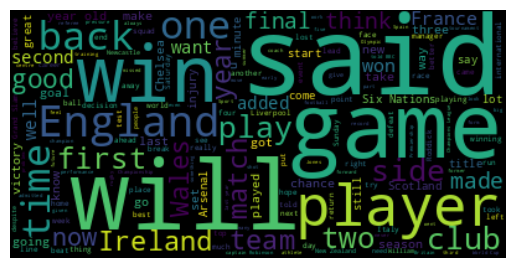



Class: 4


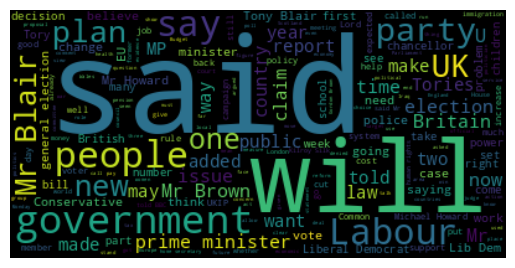



Class: 2


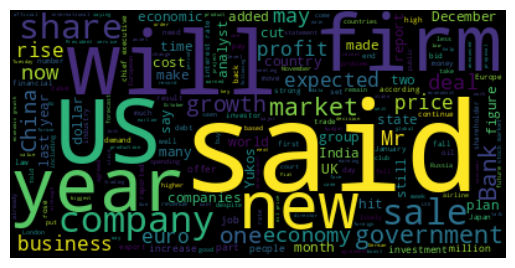



Class: 0


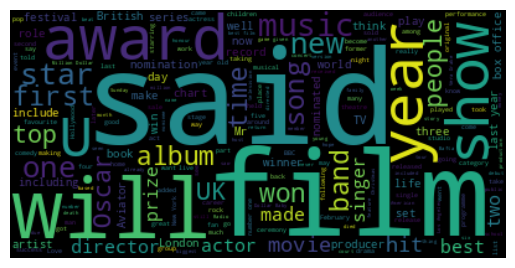



Class: 3


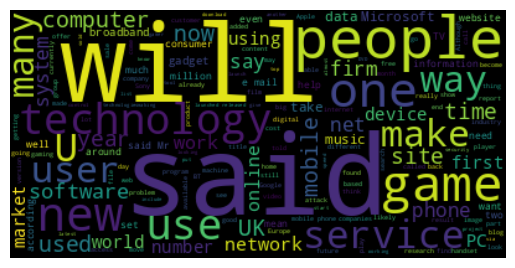



time: 7.53 s (started: 2023-05-16 11:20:23 +00:00)


In [ ]:
print_wordcloud(df_bbc['text'].values, best_labels)

Class: sport


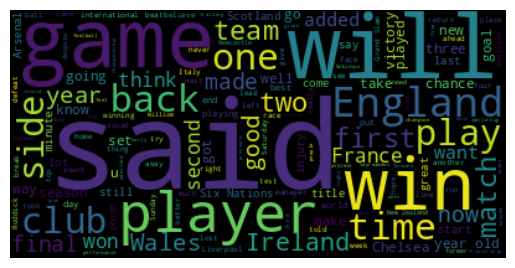



Class: entertainment


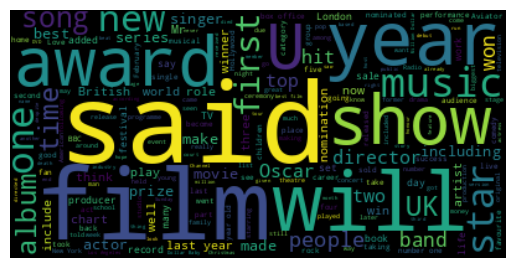



Class: tech


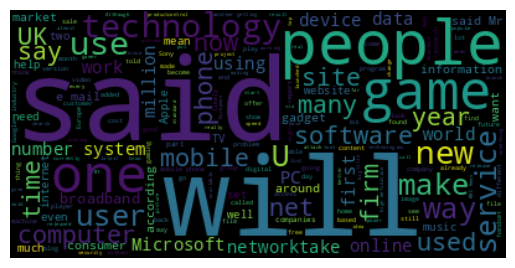



Class: business


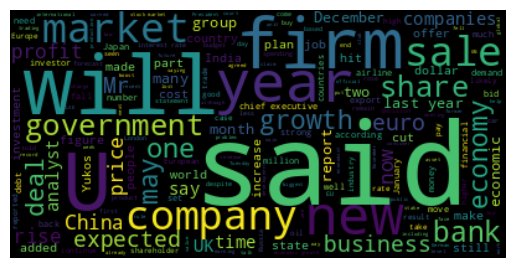



Class: politics


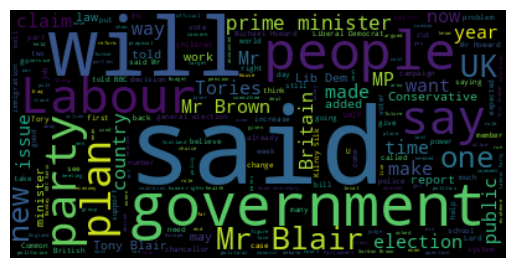



time: 7.79 s (started: 2023-05-16 11:20:31 +00:00)


In [ ]:
print_wordcloud(df_bbc['text'].values, df_bbc['label'].values)

En analysant les nuages de mots et en les comparant, nous pouvons déduire les classes prédites comme suit : la classe 0 est fortement associée à la catégorie "divertissement" en raison de la similitude des termes les plus fréquents dans cette classe et cette catégorie. De même, la classe 1 est étroitement liée à la catégorie "sports", la classe 2 correspond approximativement à la catégorie "business", la classe 3 est semblable à la catégorie "technologie", et enfin, la classe 4 peut être rapprochée de la catégorie "politique" en raison de la similarité des termes les plus fréquents.


# La représentation ROBERTA

## Espace Original

In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(bbc_roberta)
kmeans_labels = KMeans(k_bbc, random_state=42).fit(bbc_roberta).labels_
# spectral_labels = SpectralClustering(k_bbc, n_components= bbc_roberta.shape[1], assign_labels="discretize", random_state=42).fit(bbc_roberta).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(bbc_roberta).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_bbc).fit_predict(bbc_roberta)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_bbc, linkage="complete").fit_predict(bbc_roberta)
cah_labels_average = AgglomerativeClustering(n_clusters=k_bbc, linkage="average").fit_predict(bbc_roberta)
cah_labels_single = AgglomerativeClustering(n_clusters=k_bbc, linkage="single").fit_predict(bbc_roberta)
# Crashes with RAM problem
# gaussian = GaussianMixture(n_components=k_bbc, random_state=42).fit_predict(bbc_roberta)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


time: 4min 3s (started: 2023-05-16 11:20:39 +00:00)


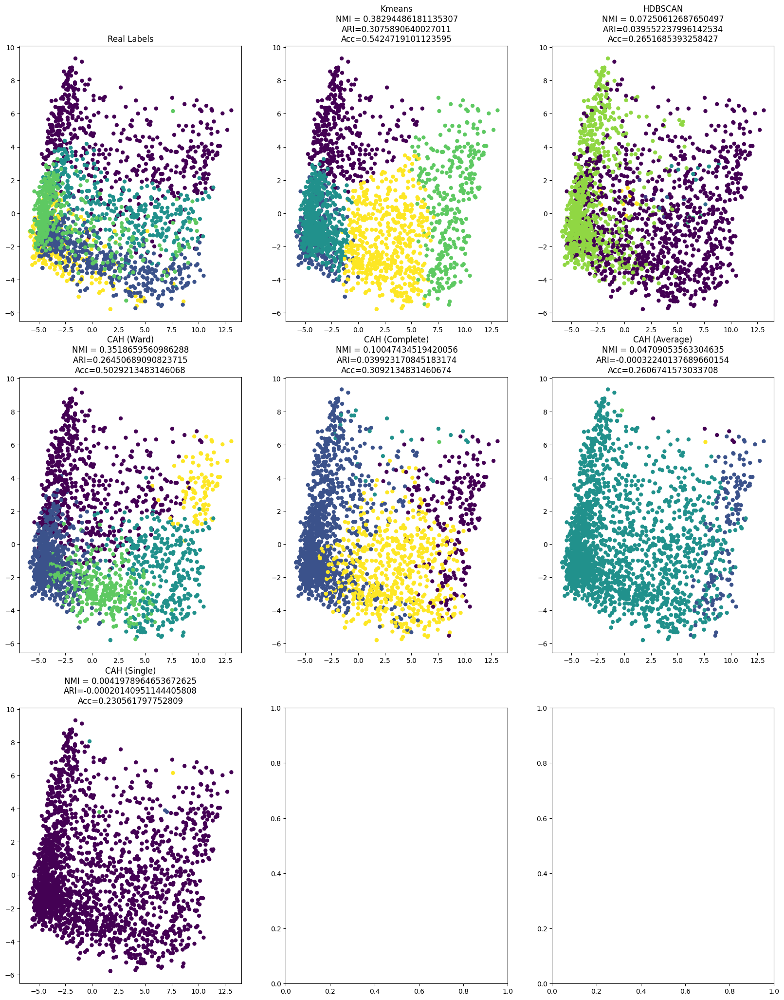

time: 2.27 s (started: 2023-05-16 11:24:42 +00:00)


In [ ]:
results_bbc_roberta_redim["original"] = eval_clustering_2D(X_reduced, map_labels(bbc_labels), [kmeans_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

 Les résultats obtenus soulignent que la plupart des méthodes de clustering utilisées ne parviennent pas à bien distinguer les classes dans leur espace d'origine, ce qui se reflète par des mesures d'estimation aléatoire des étiquettes (ARI proche de 0). Il est intéressant de noter que les modèles Kmeans, CAH(Ward) et MMG obtiennent de meilleurs résultats que les autres modèles, mais ils ne permettent toujours pas d'améliorations significatives en termes d'interprétation des données.

## Espace réduit (approche tandem)

### PCA avec 2 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


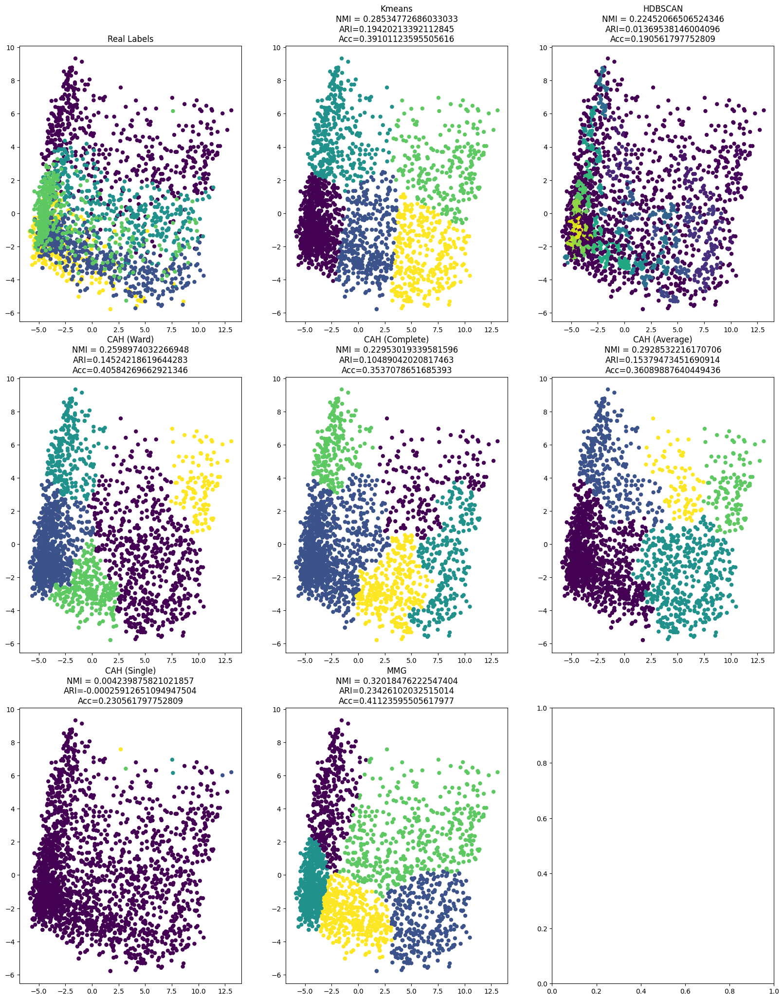

time: 5.3 s (started: 2023-05-16 11:24:44 +00:00)


In [ ]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(bbc_roberta)
results_bbc_roberta_redim['pca2'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels))

### PCA avec 20 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


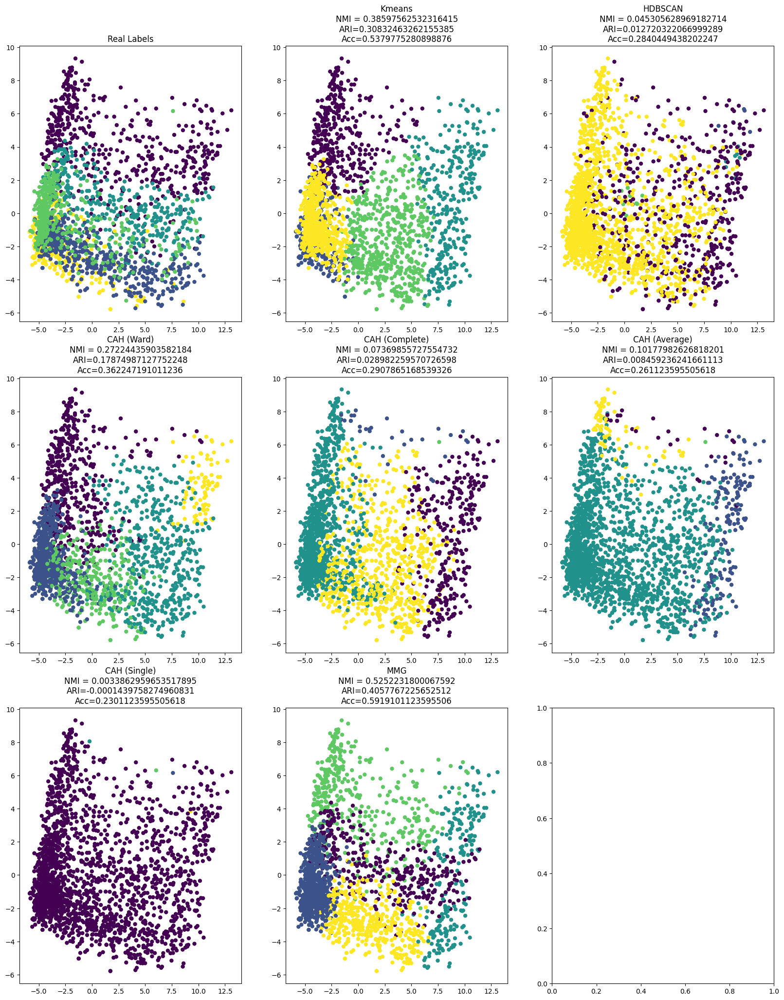

time: 7.17 s (started: 2023-05-16 11:24:50 +00:00)


In [ ]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(bbc_roberta)
results_bbc_roberta_redim['pca20'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels))

Les classes se superposent, rendant la classification difficile pour les algorithmes classiques, ce qui implique des performances potentiellement inférieures à celles de BERT. Les modèles Kmeans et MMG se distinguent avec des taux d'accuracy de 53% et 59% respectivement.

###TSNE avec 2 composantes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


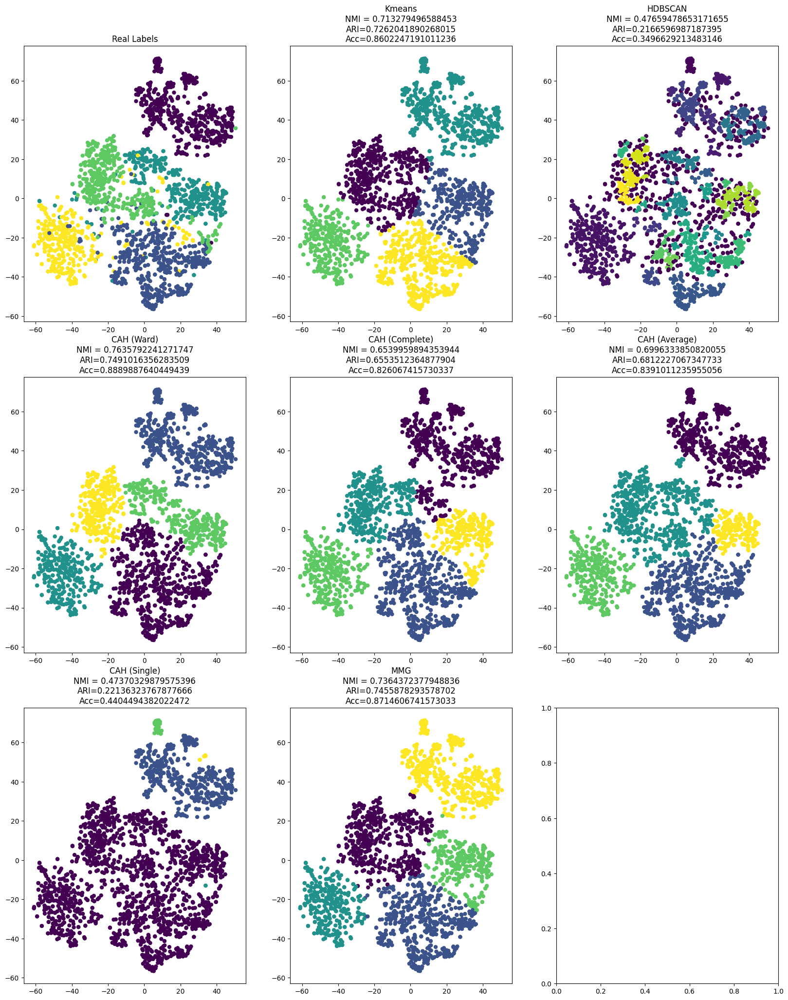

time: 28.9 s (started: 2023-05-16 11:24:57 +00:00)


In [ ]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(bbc_roberta)
results_bbc_roberta_redim['tsne'] = run_clustering(X_reduced_tsne, k_bbc, map_labels(bbc_labels))

L'application de tSNE aux données a considérablement amélioré les performances de tous les modèles en créant un espace où les classes sont plus facilement séparables. Parmi les meilleurs modèles, on trouve Kmeans, Ward, Average et MMG. Le modèle Ward se distingue en obtenant un indice de similarité NMI de 76% et une précision de 88%.


### UMAP avec 2 composantes

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(bbc_roberta)

time: 21.8 s (started: 2023-05-16 11:25:26 +00:00)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


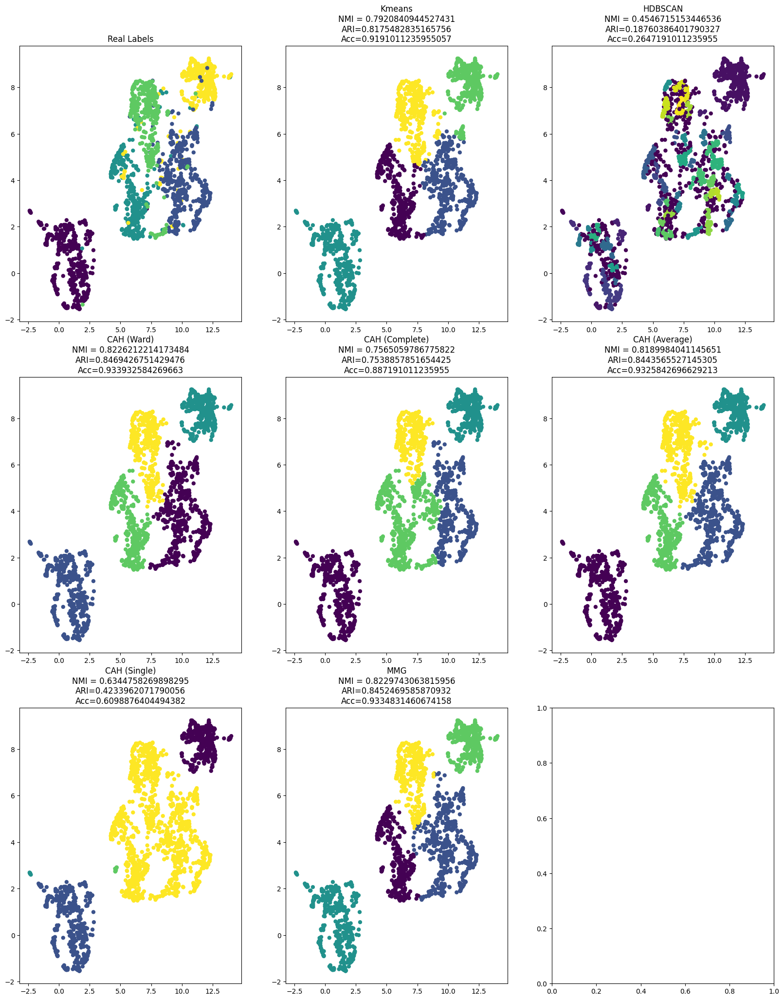

time: 5.14 s (started: 2023-05-16 11:25:48 +00:00)


In [ ]:
results_bbc_roberta_redim['umap'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels))

### UMAP avec 20 composantes

In [ ]:
X_reduced = UMAP(n_components=20, random_state=42).fit_transform(bbc_roberta)

time: 26.3 s (started: 2023-05-16 11:25:53 +00:00)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


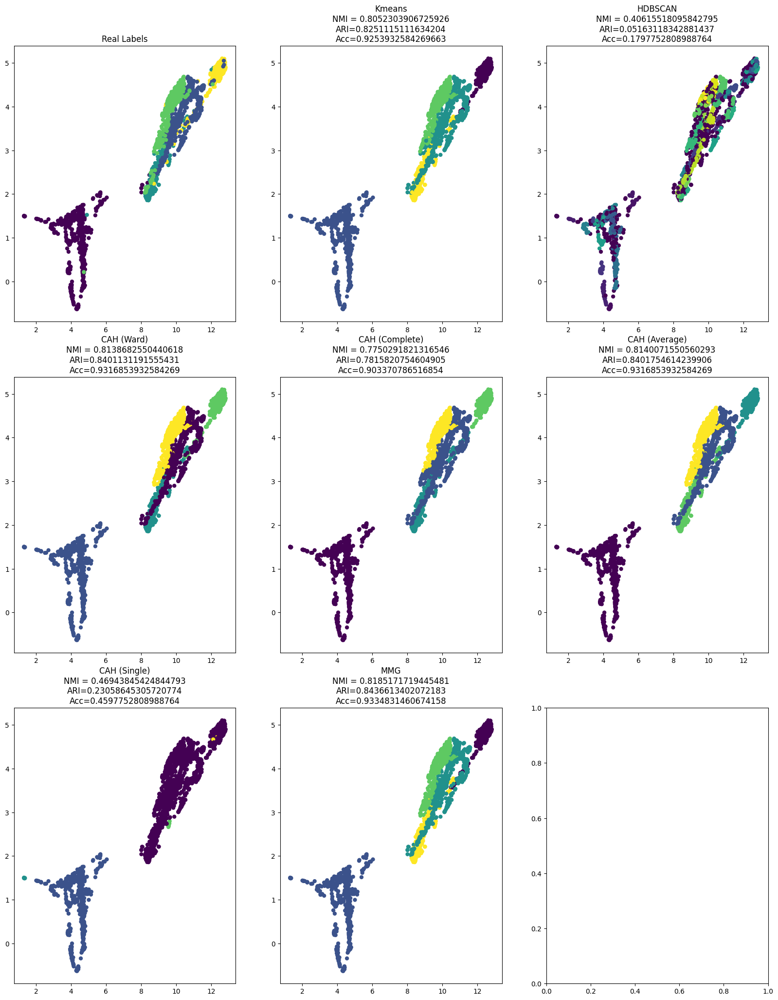

time: 4.91 s (started: 2023-05-16 11:26:19 +00:00)


In [ ]:
results_bbc_roberta_redim['umap20'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels))

Les performances des différents modèles ont été considérablement améliorées lors de l'application de l'UMAP aux données, car dans cet espace, les classes sont clairement séparables. La plupart des modèles ont convergé vers des résultats de haute précision(accuracy), à l'exception de HDBSCAN et CAH(Single). Le meilleur modèle, avec une accuracy de 93,4%, est Kmeans.

### Autoencodeur avec 2 composantes

In [ ]:
'''n_components=2
X_reduced = autoencoder(bbc_roberta.astype("float32"), n_components, seed=42, learning_rate=1e-3)'''

'n_components=2\nX_reduced = autoencoder(bbc_roberta.astype("float32"), n_components, seed=42, learning_rate=1e-3)'

time: 4.5 ms (started: 2023-05-16 11:26:24 +00:00)


In [ ]:
#results_bbc_roberta_redim['autoencoder'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels))

time: 342 µs (started: 2023-05-16 11:26:24 +00:00)


Lors de l'application des différentes méthodes de clustering sur l'espace obtenu à partir de l'autoencodeur, nous constatons que les classes sont plus difficiles à séparer car elles se chevauchent davantage. Malgré cela, le modèle CAH(Ward) se démarque avec une accuracy de 80%. Cependant, les résultats obtenus avec l'autoencodeur ne sont pas aussi compétitifs que ceux obtenus avec UMAP et tSNE.

## Interpretations des resultats 

In [ ]:
from copy import deepcopy
results_temp = deepcopy(results_bbc_roberta_redim)
for method in results_temp:
    for result in results_temp[method]:
        nmi, ari, acc = results_temp[method][result]
        results_temp[method][result] = {
            'nmi': nmi,
            "ari": ari,
            'acc': acc
        }

time: 1.51 ms (started: 2023-05-16 11:26:24 +00:00)


In [ ]:
results_roberta_bbc = pd.DataFrame.from_dict({(i,j): results_temp[i][j] 
                           for i in results_temp.keys() 
                           for j in results_temp[i].keys()},
                       orient='index')

time: 5.34 ms (started: 2023-05-16 11:26:24 +00:00)


In [ ]:
results_roberta_bbc

nmi       ari       acc
original Kmeans          0.382945  0.307589  0.542472
         HDBSCAN         0.072506  0.039552  0.265169
         CAH (Ward)      0.351866  0.264507  0.502921
         CAH (Complete)  0.100474  0.039923  0.309213
         CAH (Average)   0.047091 -0.000322  0.260674
         CAH (Single)    0.004198 -0.000201  0.230562
pca2     Kmeans          0.285348  0.194202  0.391011
         HDBSCAN         0.224521  0.013695  0.190562
         CAH (Ward)      0.259897  0.145242  0.405843
         CAH (Complete)  0.229530  0.104890  0.353708
         CAH (Average)   0.292853  0.153795  0.360899
         CAH (Single)    0.004240 -0.000259  0.230562
         MMG             0.320185  0.234261  0.411236
pca20    Kmeans          0.385976  0.308325  0.537978
         HDBSCAN         0.045306  0.012720  0.284045
         CAH (Ward)      0.272244  0.178750  0.362247
         CAH (Complete)  0.073699  0.028982  0.290787
         CAH (Average)   0.101780  0.008459  0.261124
         CAH (Single)    0.003386 -0.000144  0.230112
         MMG             0.525223  0.405777  0.591910
tsne     Kmeans          0.713279  0.726204  0.860225
         HDBSCAN         0.476595  0.216660  0.349663
         CAH (Ward)      0.763579  0.749102  0.888989
         CAH (Complete)  0.653996  0.655351  0.826067
         CAH (Average)   0.699633  0.681223  0.839101
         CAH (Single)    0.473703  0.221363  0.440449
         MMG             0.736437  0.745588  0.871461
umap     Kmeans          0.792084  0.817548  0.919101
         HDBSCAN         0.454672  0.187604  0.264719
         CAH (Ward)      0.822621  0.846943  0.933933
         CAH (Complete)  0.756506  0.753886  0.887191
         CAH (Average)   0.818998  0.844357  0.932584
         CAH (Single)    0.634476  0.423396  0.609888
         MMG             0.822974  0.845247  0.933483
umap20   Kmeans          0.805230  0.825112  0.925393
         HDBSCAN         0.406155  0.051631  0.179775
         CAH (Ward)      0.813868  0.840113  0.931685
         CAH (Complete)  0.775029  0.781582  0.903371
         CAH (Average)   0.814007  0.840175  0.931685
         CAH (Single)    0.469438  0.230586  0.459775
         MMG             0.818517  0.843661  0.933483

time: 23 ms (started: 2023-05-16 11:26:24 +00:00)


In [ ]:
metric = "ari"
results_roberta_bbc[results_roberta_bbc[metric] == results_roberta_bbc[metric].max()]

,,nmi,ari,acc
umap,CAH (Ward),0.822621,0.846943,0.933933


time: 14.6 ms (started: 2023-05-16 11:26:24 +00:00)


In [ ]:
metric = "nmi"
results_roberta_bbc[results_roberta_bbc[metric] == results_roberta_bbc[metric].max()]

,,nmi,ari,acc
umap,MMG,0.822974,0.845247,0.933483


time: 14.3 ms (started: 2023-05-16 11:26:24 +00:00)


In [ ]:
metric = "acc"
best_roberta_bbc = results_roberta_bbc[results_roberta_bbc[metric] == results_roberta_bbc[metric].max()]
best_roberta_bbc

,,nmi,ari,acc
umap,CAH (Ward),0.822621,0.846943,0.933933


time: 14 ms (started: 2023-05-16 11:26:24 +00:00)


Le meilleur compromis est l'algorithme Kmeans avec  la méthode Umap en conservant 20 composantes

In [ ]:
X_reduced_best = UMAP(n_components=20, random_state=42).fit_transform(bbc_roberta)
best_labels = KMeans(k_bbc, random_state=42).fit(X_reduced_best).labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


time: 27.6 s (started: 2023-05-16 11:26:24 +00:00)


In [ ]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 1.58 ms (started: 2023-05-16 11:26:52 +00:00)


Visualization des wordclouds du meilleur clustering

Class: 1


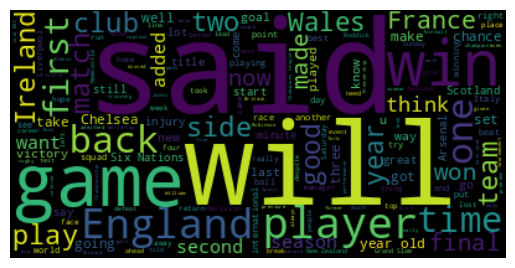



Class: 4


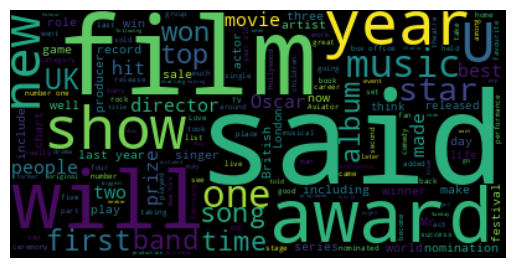



Class: 2


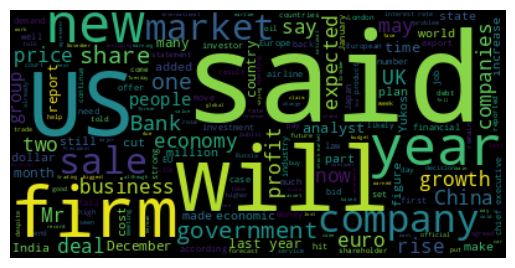



Class: 0


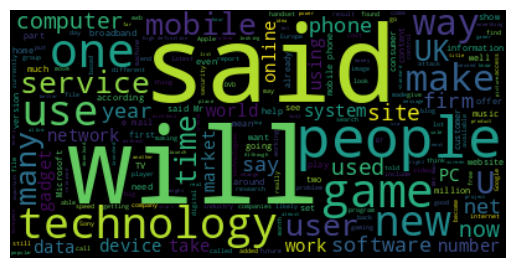



Class: 3


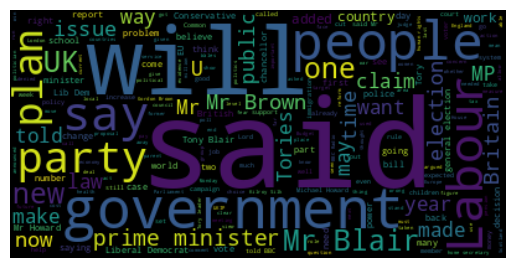



time: 7.38 s (started: 2023-05-16 11:26:52 +00:00)


In [ ]:
print_wordcloud(df_bbc['text'].values, best_labels)

Class: sport


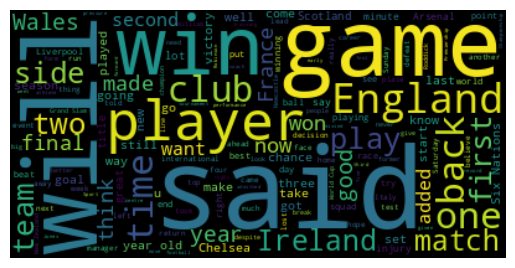



Class: entertainment


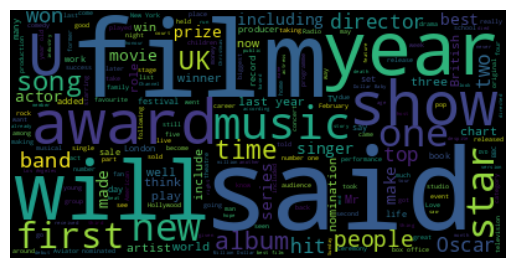



Class: tech


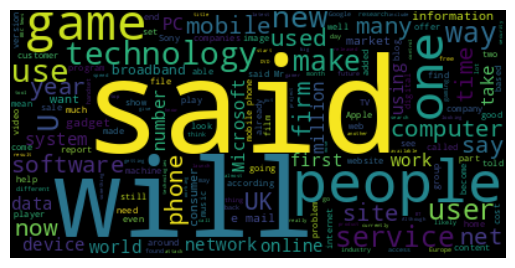



Class: business


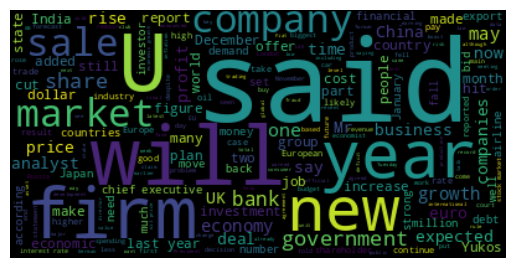



Class: politics


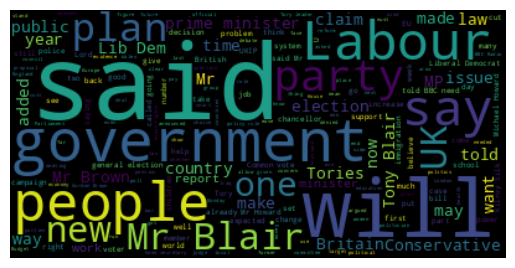



time: 7.96 s (started: 2023-05-16 11:26:59 +00:00)


In [ ]:
print_wordcloud(df_bbc['text'].values, df_bbc['label'].values)

En analysant les nuages de mots et en les comparant, nous pouvons déduire les classes prédites comme suit : la classe 0 correspond approximativement à "entertainment", la classe 1 est approximativement "sports", la classe 2 est approximativement "business", et la classe 3 est approximativement "tech". Ces conclusions sont basées sur la similarité des termes les plus fréquents observés dans les deux classes correspondantes.